In [1]:
RESET_PROJECT_FILES = True

if RESET_PROJECT_FILES:
  ! rm -rf DeepColor utils bash &&\
  git clone https://github.com/ArnoBen/DeepColor &&\
  mv DeepColor/* . &&\
  rm -rf DeepColor

Cloning into 'DeepColor'...
remote: Enumerating objects: 237, done.
remote: Counting objects: 100% (100/100), done.
remote: Compressing objects: 100% (71/71), done.
remote: Total 237 (delta 56), reused 71 (delta 29), pack-reused 137
Receiving objects: 100% (237/237), 172.63 MiB | 17.58 MiB/s, done.
Resolving deltas: 100% (112/112), done.


In [12]:
import os

RESET_IMAGE_FOLDER = False

if RESET_IMAGE_FOLDER:
  ! rm -r images/

if not os.path.isdir('images'):
  # ! ./bash/download_extract_ffhq.sh
  ! gdown 1GtxNs-zIxypHCYD88_gG2Gf2KE7AvU-L
  ! 7z x 'coco256.7z'

Downloading...
From: https://drive.google.com/uc?id=1GtxNs-zIxypHCYD88_gG2Gf2KE7AvU-L
To: /content/coco256.7z
100% 1.13G/1.13G [00:04<00:00, 230MB/s]

7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan         1 file, 1133731977 bytes (1082 MiB)

Extracting archive: coco256.7z
--
Path = coco256.7z
Type = 7z
Physical Size = 1133731977
Headers Size = 214910
Method = Copy
Solid = -
Blocks = 25018

  0%      2% 766 - images/test/36000/000000484590.jpg                                               6% 1556 - images/test/37000/000000432919.jpg                                                8% 2180

In [11]:
import os
import time
import datetime
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import cv2
from PIL import Image
from utils.dataset import make_dataset
from utils.conversions import rgb2lab, lab2rgb, bgr2rgb, bgr2lab, denormalize_lab
from utils.decomposition import decompose, recompose, decompose_generator
from keras.callbacks import TensorBoard, LearningRateScheduler, EarlyStopping, ModelCheckpoint
from keras.preprocessing.image import ImageDataGenerator 
from tensorflow.keras.layers import Layer, Conv2D, LeakyReLU, BatchNormalization, ReLU, Conv2DTranspose, Dropout, Concatenate
matplotlib.rcParams["axes.spines.left"] = False
matplotlib.rcParams["axes.spines.bottom"] = False
matplotlib.rcParams["xtick.major.bottom"] = False
matplotlib.rcParams["ytick.major.left"] = False

In [4]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.applications import ResNet50

def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def build_resnet50_unet(input_shape):
    """ Input """
    inputs = Input(input_shape)
    grayscale_input = Lambda(lambda x: x[..., 0][..., tf.newaxis], input_shape=input_shape)(inputs)
    grayscale_resnet_input = Concatenate()([grayscale_input, grayscale_input, grayscale_input])

    """ Pre-trained ResNet50 Model """
    resnet50 = ResNet50(include_top=False, weights="imagenet", input_tensor=grayscale_resnet_input)

    """ Encoder """
    s1 = resnet50.get_layer("input_1").output           ## (256 x 256)
    s2 = resnet50.get_layer("conv1_relu").output        ## (128 x 128)
    s3 = resnet50.get_layer("conv2_block3_out").output  ## (64 x 64)
    s4 = resnet50.get_layer("conv3_block4_out").output  ## (32 x 32)

    """ Bridge """
    b1 = resnet50.get_layer("conv4_block6_out").output  ## (16 x 16)

    """ Decoder """
    d1 = decoder_block(b1, s4, 512)                     ## (32 x 32)
    d2 = decoder_block(d1, s3, 256)                     ## (64 x 64)
    d3 = decoder_block(d2, s2, 128)                     ## (128 x 128)
    d4 = decoder_block(d3, s1, 64)                      ## (256 x 256)

    """ Output """
    outputs = Conv2D(2, (1, 1), padding="same", activation="sigmoid")(d4)

    model = Model(inputs, outputs, name="ResNet50_U-Net")
    return model

input_shape = (256, 256, 1)
model = build_resnet50_unet(input_shape)
model.summary()

94765736/94765736 [==============================] - 5s 0us/step
Model: "ResNet50_U-Net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 1  0           []                               
                                )]                                                                
                                                                                                  
 lambda (Lambda)                (None, 256, 256, 1)  0           ['input_1[0][0]']                
                                                                                                  
 concatenate (Concatenate)      (None, 256, 256, 3)  0           ['lambda[0][0]',                 
                                                                  'lambda[0][0]',                 
                    

In [13]:
def preprocessing(image):
    image = np.array(image, dtype=np.uint8)
    lab_image = cv2.cvtColor(image, cv2.COLOR_RGB2LAB) / 255
    return lab_image

datagen = ImageDataGenerator(
    horizontal_flip=True,
    preprocessing_function = preprocessing
    )

train_data = datagen.flow_from_directory("images/train/", class_mode=None, target_size=(256, 256), batch_size=32)
valid_data = datagen.flow_from_directory("images/valid/", class_mode=None, target_size=(256, 256), batch_size=32)

Found 16346 images belonging to 19 classes.
Found 4329 images belonging to 5 classes.


In [16]:
def custom_generator(data_generator):
    n = data_generator.samples
    batch_size = data_generator.batch_size
    end_index = n - n % batch_size
    while True:
        batch = data_generator.next()
        L_batch = batch[..., 0][..., np.newaxis]
        ab_batch = batch[..., 1:]
        yield L_batch, ab_batch

In [25]:
def compare_output():
  for i, Lab in enumerate(custom_generator(valid_data)):
    L, ab = Lab
    fig, axes = plt.subplots(1, 3, figsize=(12, 6))
    ab_pred = model.predict(L)
    
    img = np.concatenate((L[0], ab[0]), axis=-1)
    img_pred = np.concatenate((L[0], ab_pred[0]), axis=-1)

    img = (img * 255).astype(np.uint8)
    img_pred = (img_pred * 255).astype(np.uint8)
    
    axes[0].imshow(L[0, :, :, 0], cmap='gray')
    axes[1].imshow(cv2.cvtColor(img, cv2.COLOR_LAB2RGB))
    axes[2].imshow(cv2.cvtColor(img_pred, cv2.COLOR_LAB2RGB))
    plt.show()
    if i == 4:
      break

class GenerateImageCallback(tf.keras.callbacks.Callback):
    def __init__(self):
        super(GenerateImageCallback, self).__init__()

    def on_epoch_end(self, epoch, logs=None):
        compare_output()

1/1 [==============================] - 0s 25ms/step


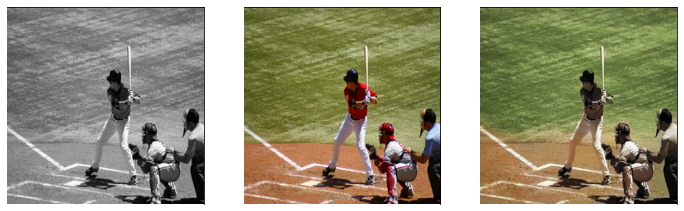

1/1 [==============================] - 0s 29ms/step


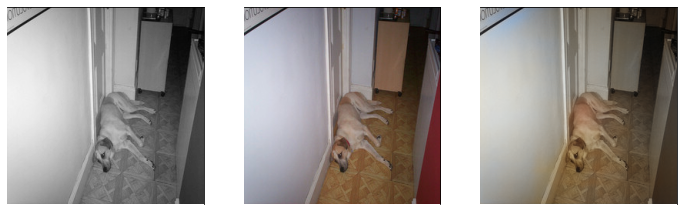

1/1 [==============================] - 0s 27ms/step


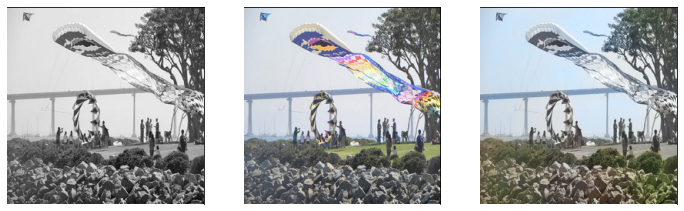

1/1 [==============================] - 0s 27ms/step


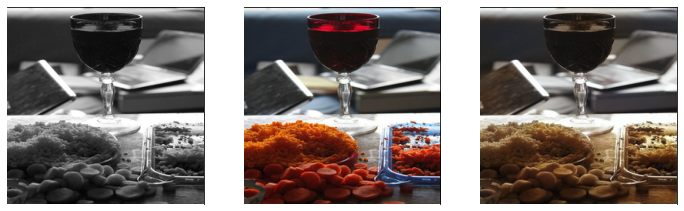

1/1 [==============================] - 0s 34ms/step


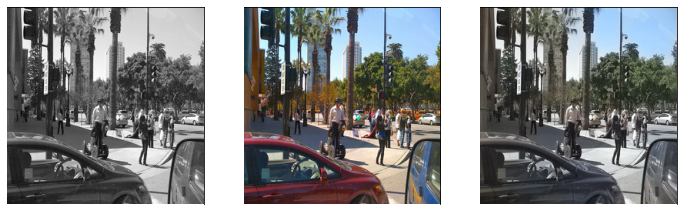

In [26]:
compare_output()

In [8]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [20]:
# Logs
log_dir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

# Tensorboard
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

# Early stopping
early_stopping = EarlyStopping(patience=5, restore_best_weights=True)

# Learning rate scheduler
def scheduler(epoch, lr):
    # Decreases the lr exponentially every n epoch
    return lr * tf.math.exp(-0.1) if ((epoch != 0) and (epoch % 4 == 0)) else lr
    
lr_scheduler = LearningRateScheduler(scheduler)

# Model checkpoints
mc = ModelCheckpoint('weights/checkpoints/{epoch:08d}.h5', save_weights_only=True, period=5)


In [15]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)
model.compile(optimizer=generator_optimizer, loss='mae')

Epoch 1/14
  6/511 [..............................] - ETA: 11:41 - loss: 0.0301

1/1 [==============================] - 0s 26ms/step


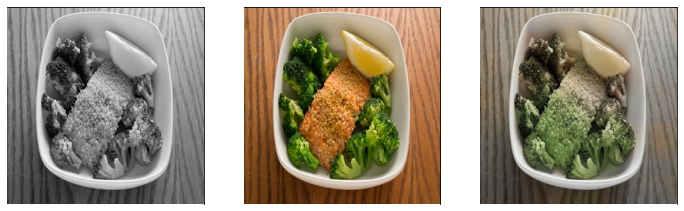

1/1 [==============================] - 0s 31ms/step


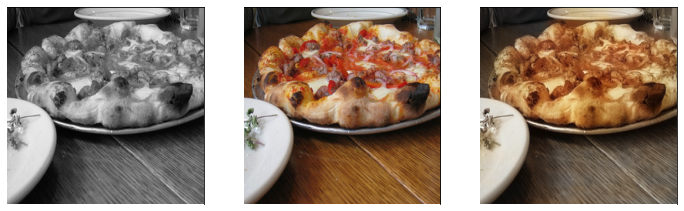

1/1 [==============================] - 0s 25ms/step


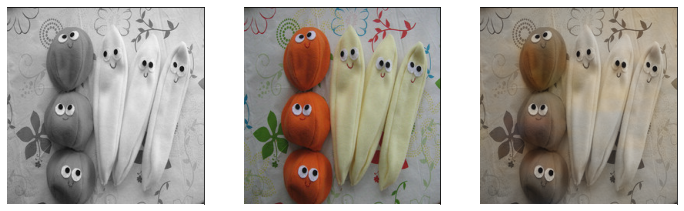

1/1 [==============================] - 0s 26ms/step


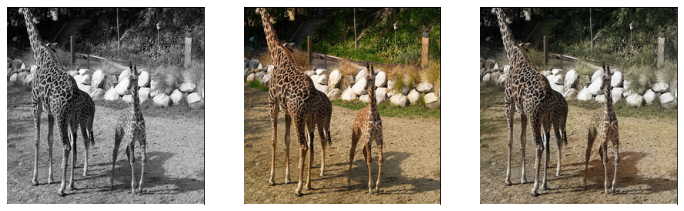

1/1 [==============================] - 0s 29ms/step


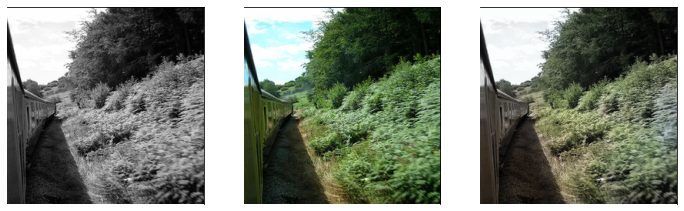

511/511 [==============================] - 790s 2s/step - loss: 0.0312 - val_loss: 0.0347 - lr: 9.0484e-05
Epoch 2/14
1/1 [==============================] - 0s 27ms/step


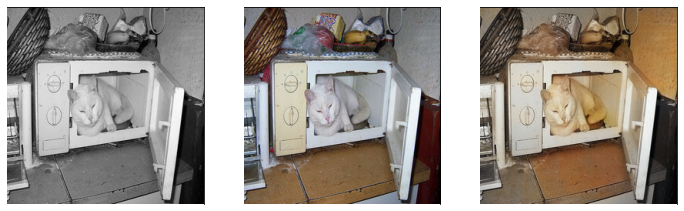

1/1 [==============================] - 0s 25ms/step


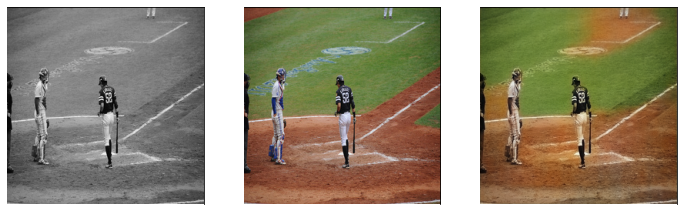

1/1 [==============================] - 0s 27ms/step


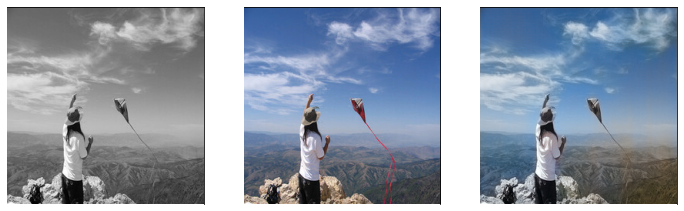

1/1 [==============================] - 0s 26ms/step


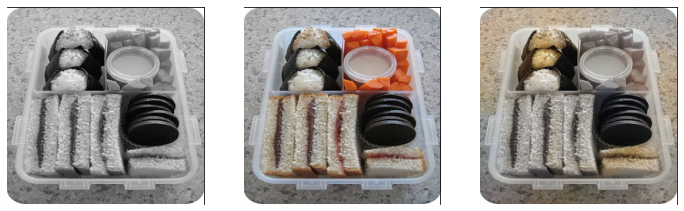

1/1 [==============================] - 0s 24ms/step


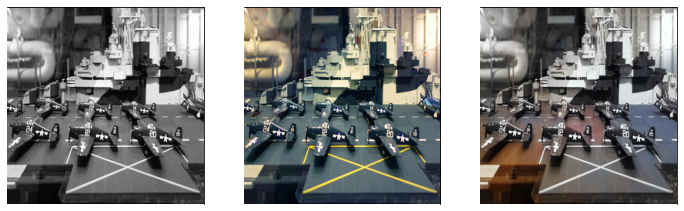

511/511 [==============================] - 772s 2s/step - loss: 0.0305 - val_loss: 0.0350 - lr: 9.0484e-05
Epoch 3/14
480/511 [===========================>..] - ETA: 42s - loss: 0.0298

In [ ]:
history = model.fit(custom_generator(train_data), 
                    validation_data=custom_generator(valid_data),
                    steps_per_epoch=len(train_data),
                    validation_steps=len(valid_data),
                    callbacks=[GenerateImageCallback(), tensorboard_callback, early_stopping, lr_scheduler, mc],
                    epochs=14
                    )

In [18]:
model.save_weights('weights/generator_0.0341')

1/1 [==============================] - 0s 26ms/step


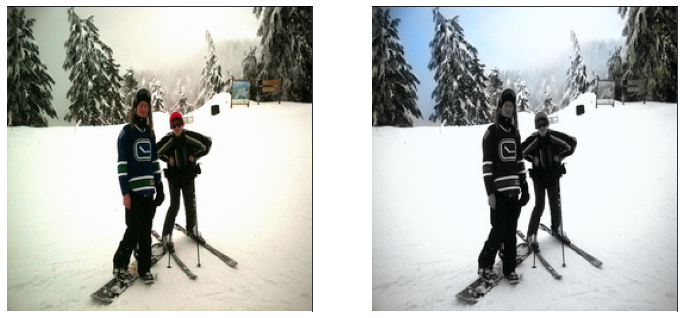

1/1 [==============================] - 0s 27ms/step


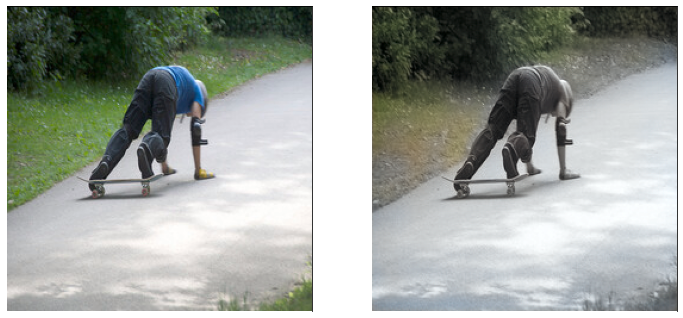

1/1 [==============================] - 0s 25ms/step


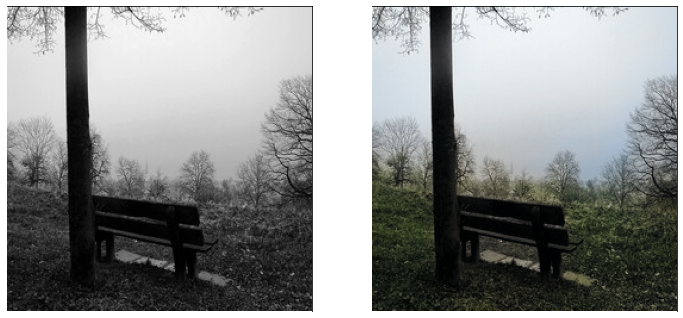

1/1 [==============================] - 0s 28ms/step


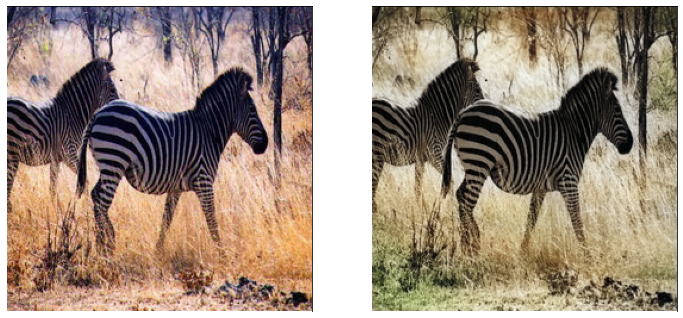

1/1 [==============================] - 0s 24ms/step


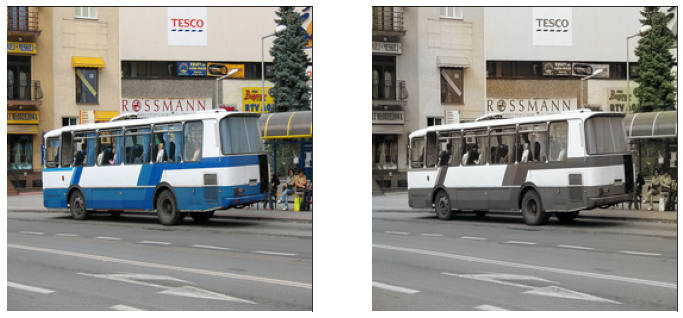

In [ ]:
compare_output()